In [1]:
## This code cell will not be shown in the HTML version of this notebook
# imports from custom library
import sys
sys.path.append('../../')
from mlrefined_libraries import superlearn_library as superlearn
from mlrefined_libraries import math_optimization_library as optlib
from mlrefined_libraries import basics_library as baslib

# demos for this notebook
plotter = superlearn.sparse_feature_selection_static
optimizers = optlib.optimizers
datapath = '../../mlrefined_datasets/superlearn_datasets/'
cost_lib = superlearn.cost_functions
classification_plotter = superlearn.classification_static_plotter.Visualizer();

# import autograd functionality to bulid function's properly for optimizers
import autograd.numpy as np

# import timer
from datetime import datetime 

# this is needed to compensate for %matplotlib notebook's tendancy to blow up images when plotted inline
%matplotlib notebook
from matplotlib import rcParams
rcParams['figure.autolayout'] = True

%load_ext autoreload
%autoreload 2

The convex combination of two functions $f_1(\mathbf{w})$ and $f_2(\mathbf{w})$ is a special linear combination of the them that takes the form

\begin{equation}
f\left(\mathbf{w}\right) = \lambda,f_1(\mathbf{w})+(1-\lambda)\,f_2(\mathbf{w})
\end{equation}

where $0\leq \lambda \leq 1$. Near the two extremes, i.e. when $\lambda=0$ or $\lambda=1$, the convex combination $f$ reduces to one of the the two original functions ($\,f_2$ in the former case and $f_1$ in the latter). However with any other value of $\lambda$ the two functions $f_1$ and $f_2$ 'compete for dominance', with $f$ taking on qualities of both e.g., its shape will be something *in between $f_1$ and $f_2$*.

#### <span style="color:#a50e3e;">Example 1: </span>  Convex combination of two functions

In this example we illustrate the convex combination of the following two functions

\begin{equation}
\begin{array}
\
f_1\left(w\right) = 2\,\text{sin}(w) + 3\,\text{cos}\left(0.1w-1\right) \\
f_2\left(w\right) = \text{sin}(10w).
\end{array}
\end{equation}
    
The function $f_1$ is drawn in the left panel and $f_2$ is shown in the middle.  In the right panel we show their convex combination, and as you pull the slider widget from left to right the value of $\lambda$ ranges from $0$ to $1$ smoothly.


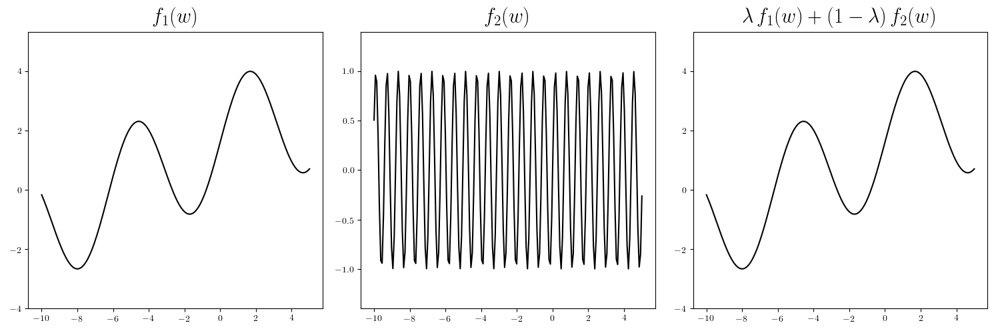
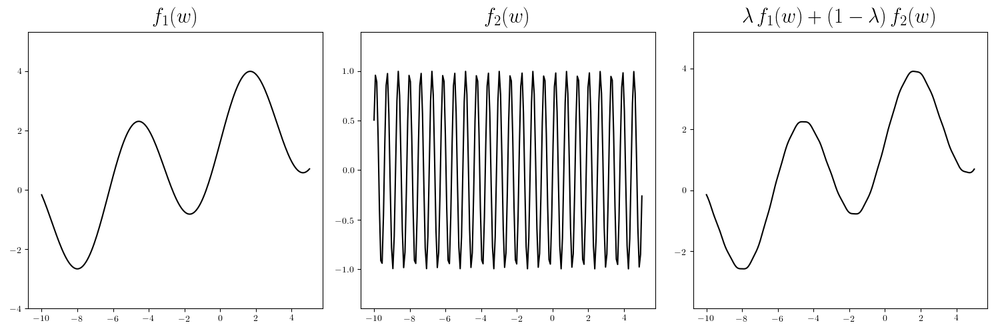
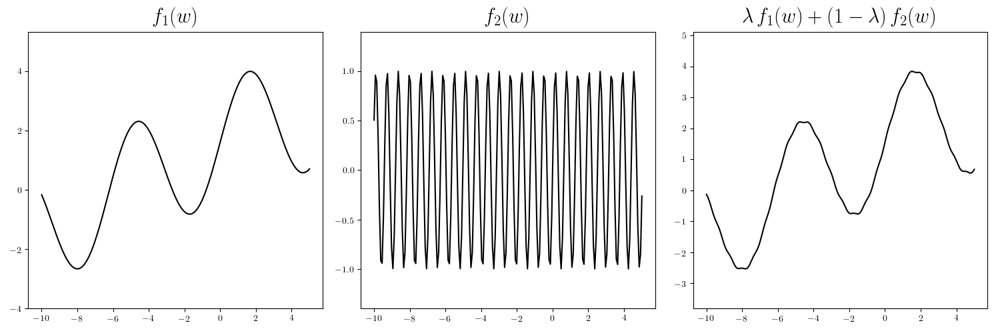
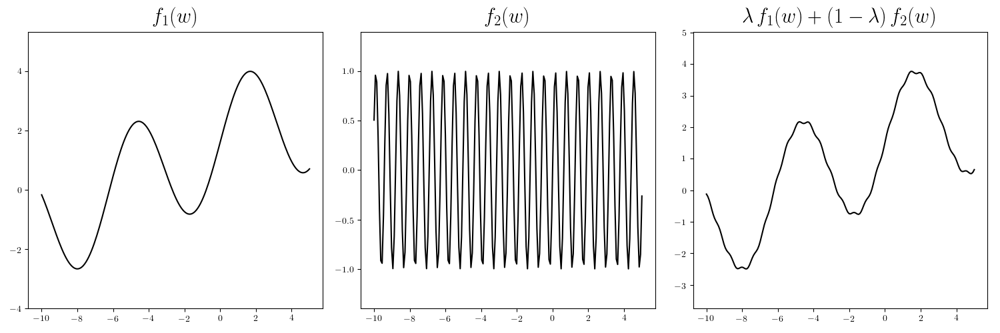
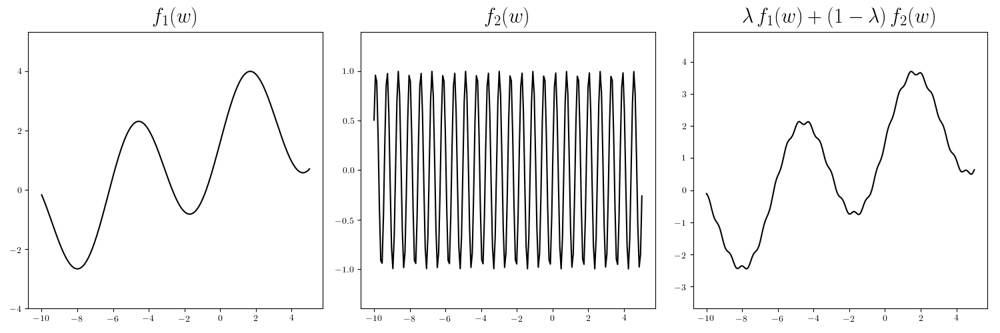
...
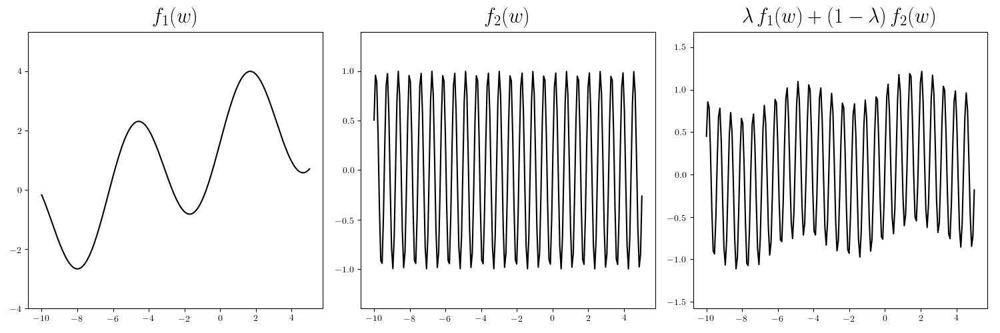
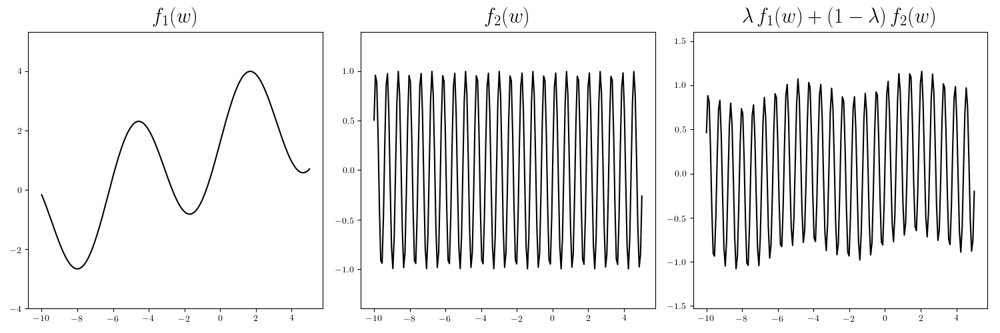
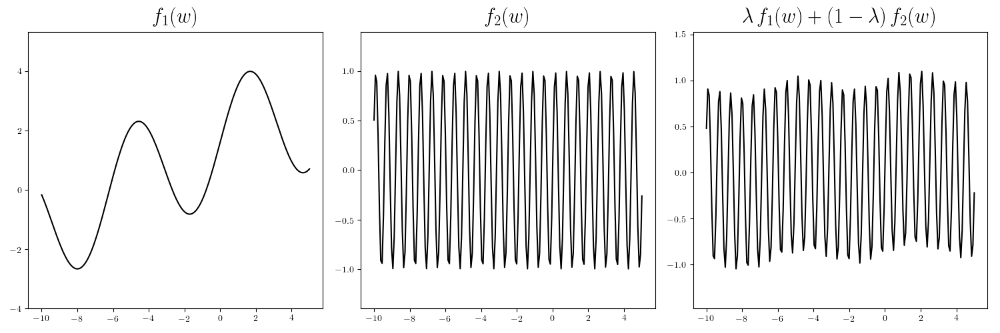
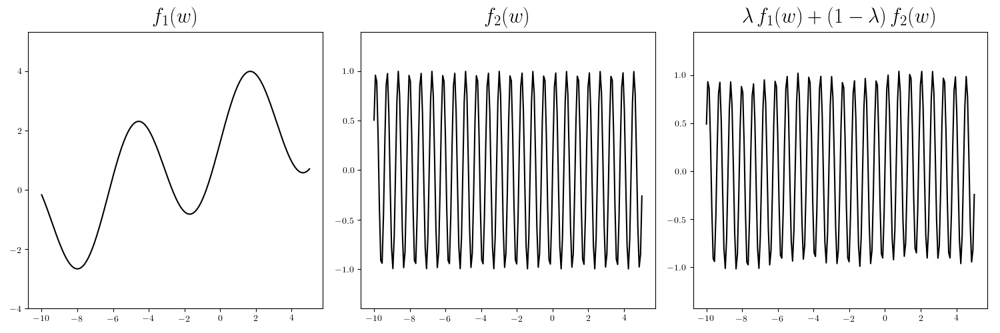
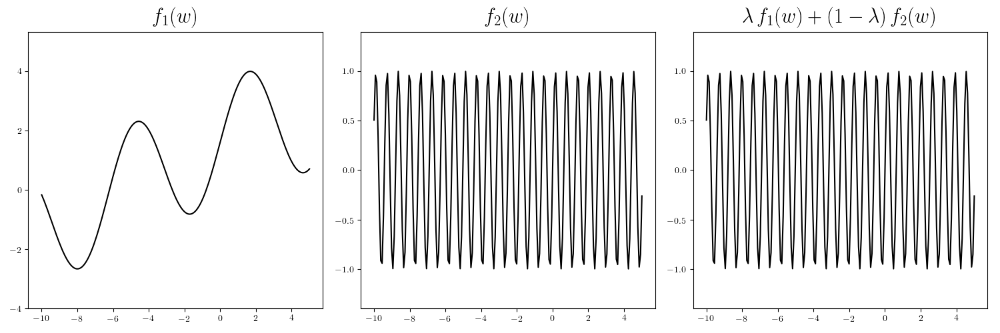

In [72]:
## This code cell will not be shown in the HTML version of this notebook
# what function should we play with?  Defined in the next line.
f1 = lambda w: 2*np.sin(w) + 3*np.cos(0.1*w-1)
f2 = lambda w: np.sin(10*w)

# create an instance of the visualizer with this function
test = baslib.convex_function_addition_2d.visualizer()

# plot away
test.draw_it(g1 = f1, g2 = f2, num_frames = 50, min_range = -10, max_range = 5, title1='$f_1(w)$', title2='$f_2(w)$', title3='$\lambda\,f_1(w)+(1-\lambda)\,f_2(w)$')

---

The highly related linear combination of two generic functions $f_1$ and $f_2$ 

\begin{equation}
f\left(\mathbf{w}\right) = f_1(\mathbf{w})+\lambda\,\,f_2(\mathbf{w})
\end{equation}

is often referred to as *regularization* in the parlance of machine learning.  More specifically the function $f_2$ is called a *regularizer*, since by adding it to function $f_1$ we adjust its shape, and $\lambda \geq 0$ is referred to as a penalty or regularization parameter (we have already seen one instance of regularization in discussing how to adjust Newton's method to deal with non-convex functions in Chapter 5).  

Here when $\lambda = 0$ the above combination reduces to $f_1$, and as we increase $\lambda$ the two functions $f_1$ and $f_2$ 'compete for dominance' in a linear combination of the two functions which takes on properties of both functions.  As we set $\lambda$ to larger and larger values the function $f_2$ dominates the combination, and eventually completely drowns out function $f_1$.  In this instance what we end up with is a highly positively scaled version of the regularizer $f_2$.

#### <span style="color:#a50e3e;">Example 2: </span>  A reguliarzed sum of two functions

In this example we illustrate the regularized combination of the two functions from the previous example.  That is instead of computing their convex combination we compute $f\left(w\right) = f_1(w)+\lambda\,\,f_2(w)$.
    
The function $f_1$ is drawn in the left panel and $f_2$ is shown in the middle.  In the right panel we show their regularized combination, and as you pull the slider widget from left to right the value of $\lambda$ ranges from $0$ to $100$ smoothly, and the function shown changes from $f_1$ to $f_1(w) + 100\,f_2(w)$.  The value of $\lambda = 100$ is so large that the regularizer $f_2$ drowns out most of the function $f_1$, and we are left with what looks like a highly scaled version of $f_2$.


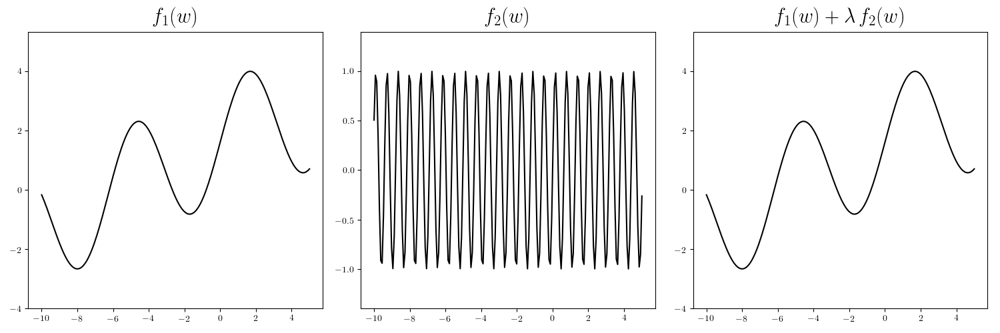
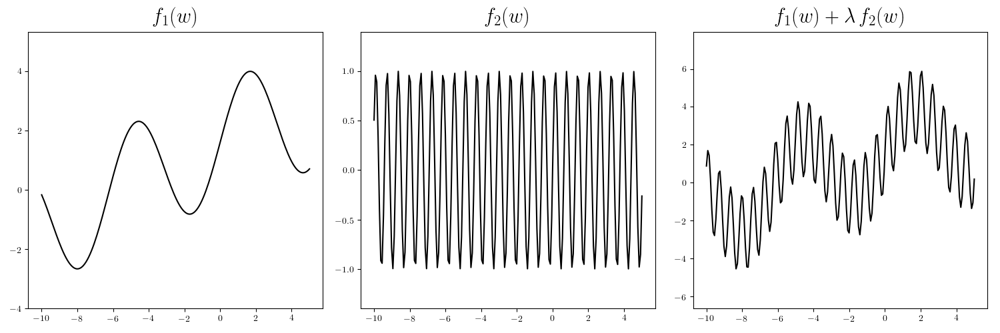
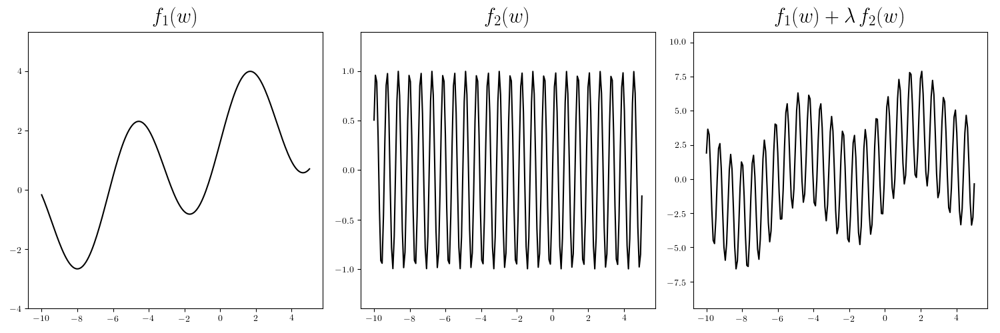
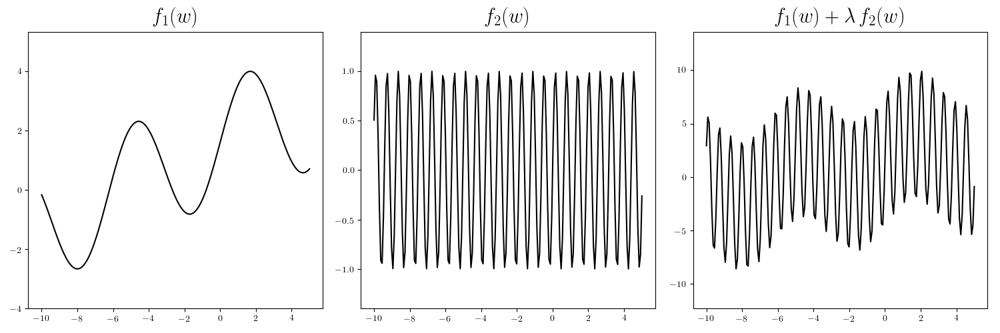
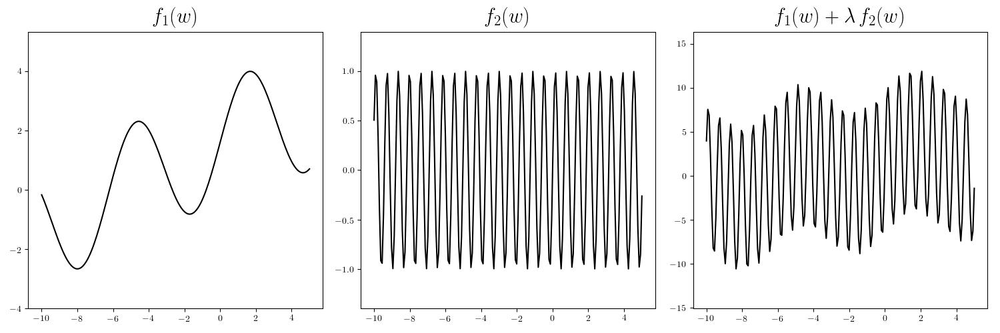
...
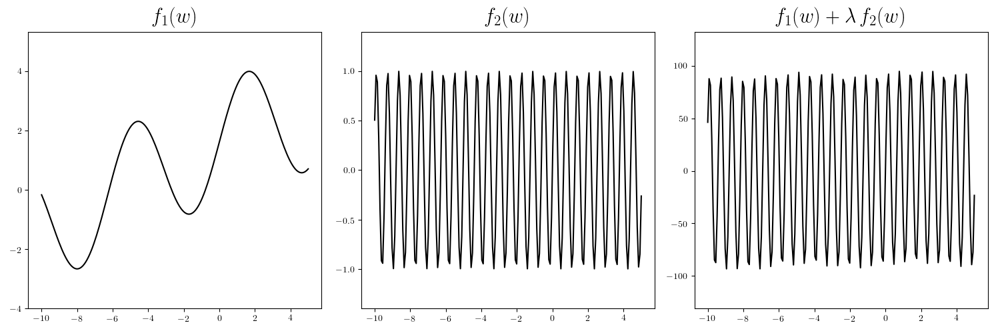
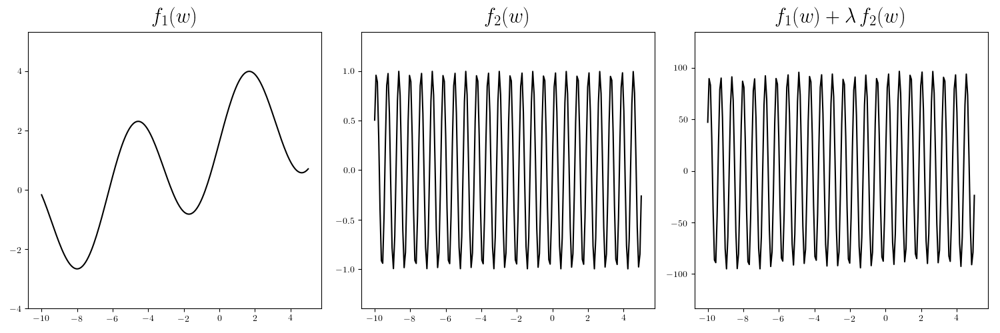
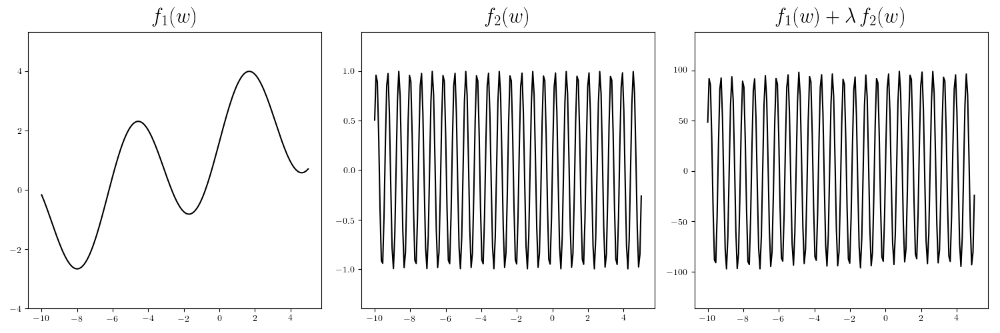
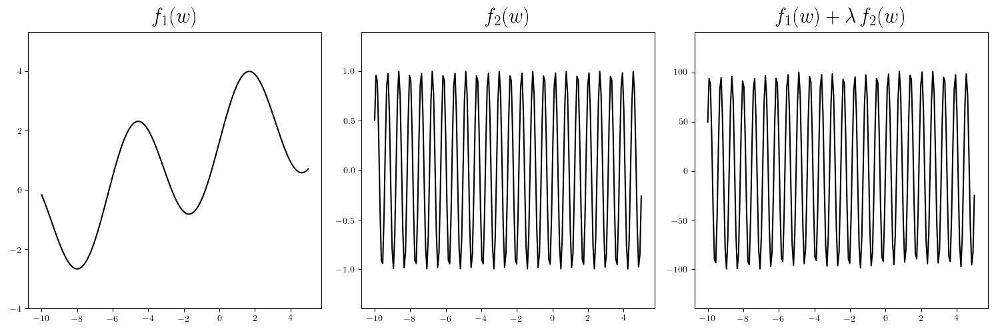
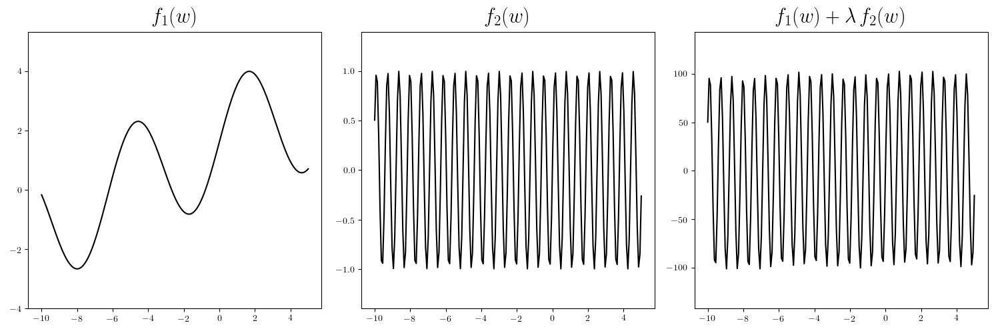

In [69]:
## This code cell will not be shown in the HTML version of this notebook
# what function should we play with?  Defined in the next line.
f1 = lambda w: 2*np.sin(w) + 3*np.cos(0.1*w-1)
f2 = lambda w: np.sin(10*w)

# create an instance of the visualizer with this function
test = baslib.convex_function_addition_2d.visualizer()

# plot away
test.draw_it(g1 = f1, g2 = f2, num_frames = 50, min_range = -10, max_range = 5,alpha_range = [0,100], title1='$f_1(w)$', title2='$f_2(w)$', title3='$f_1(w)+\lambda\,f_2(w)$',mode = 'regularization')

#### <span style="color:#a50e3e;">Example 3: </span>  Regularization changes minima locations

Below we show the regularized combination of $f_1\left(w\right) = \left(w - 3.5\right)^2$ and the regularizer $f_2\left(w\right) = \left\vert w \right\vert$ using the same visual scheme displayed in the prior examples of this Section.  

In this example note in particular how regularization *changes the location of the minima of $f_1$*.  The minimum of $f_1$ is clearly at $w = 3.5$, but as we add more and more of the regularizer (in turning up the value of $\lambda$), this minima *moves* in the linear combination from this point towards the minimum of the regularizer at $w = 0$.  Eventually, as $\lambda$ is set larger and larger (towards the maximum value here which was $\lambda = 150$) and the regularizer $f_2$ dominates, the minimum of the sum becomes the minimum of the regularizer.


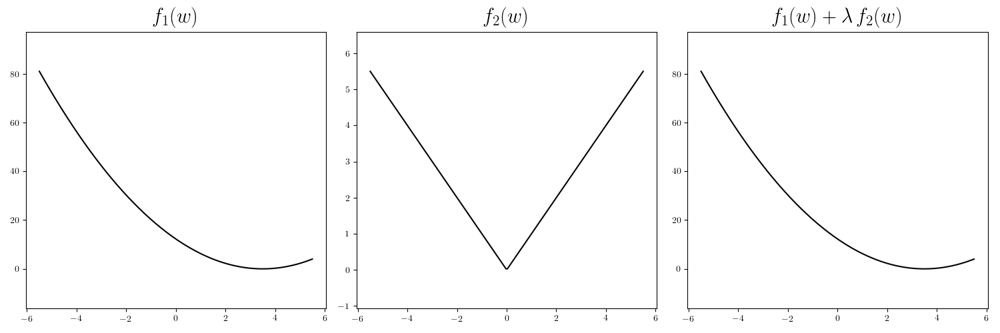
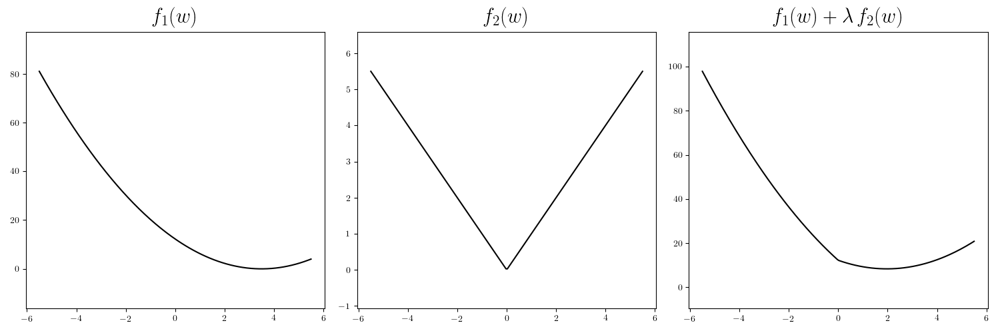
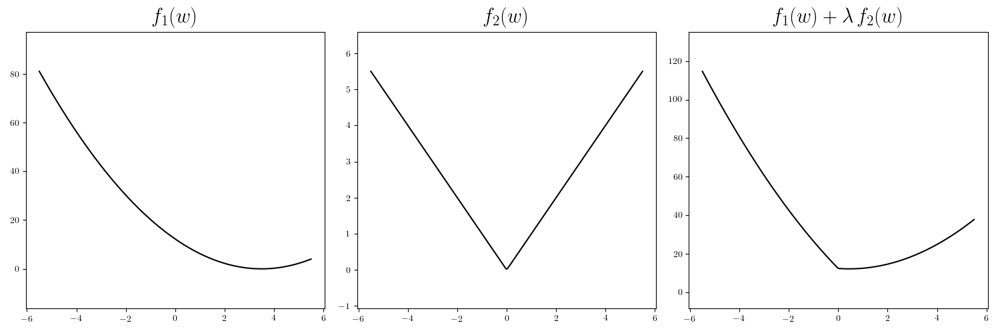
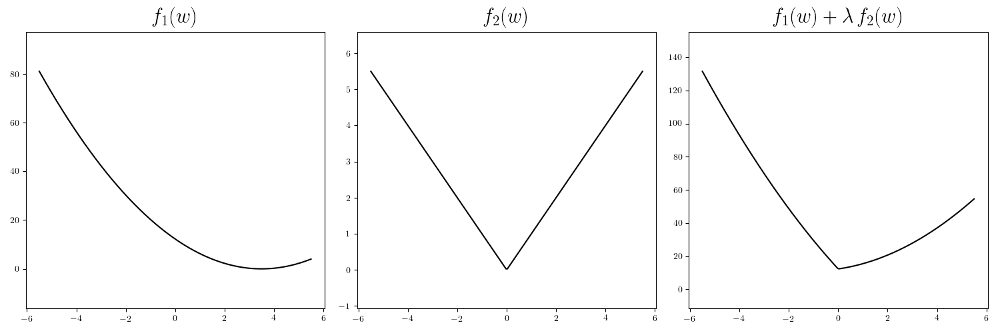
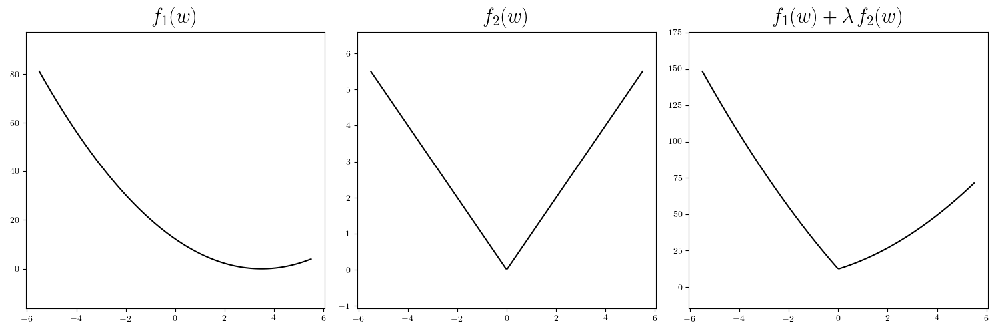
...
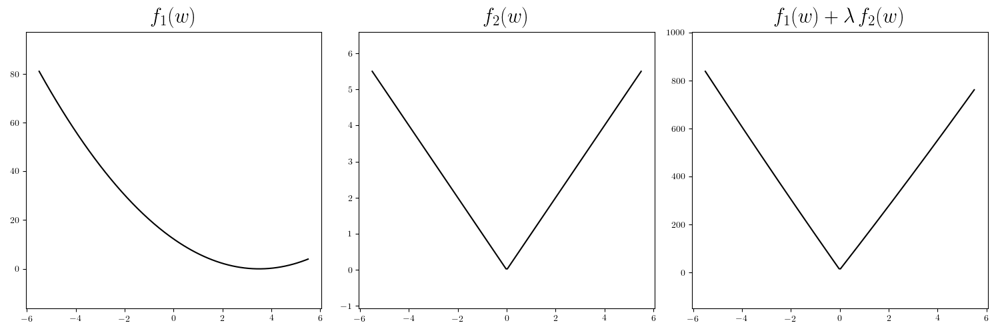
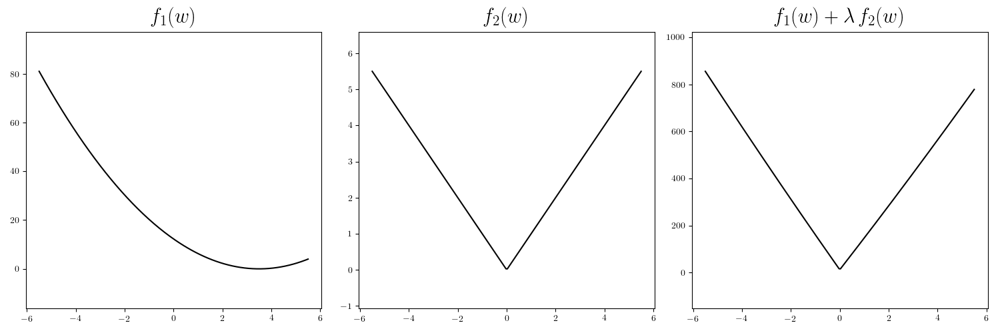
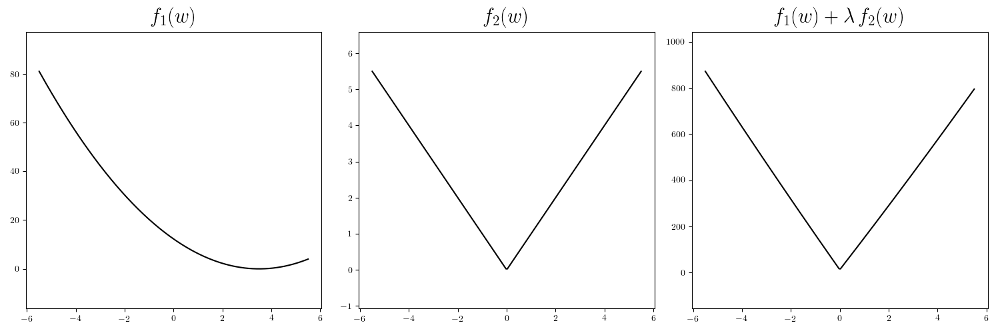
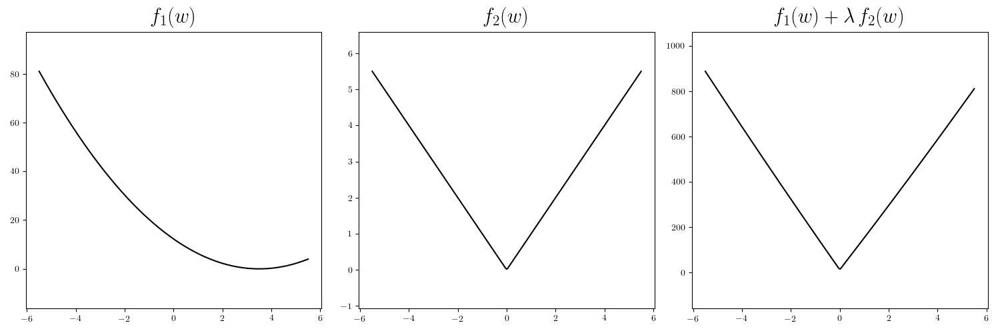
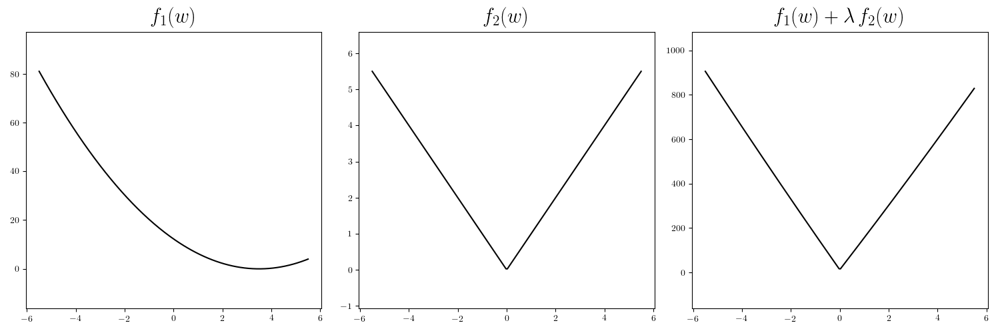

In [81]:
## This code cell will not be shown in the HTML version of this notebook
# what function should we play with?  Defined in the next line.
f1 = lambda w: (w - 3.5)**2
f2 = lambda w: np.abs(w)

# create an instance of the visualizer with this function
test = baslib.convex_function_addition_2d.visualizer()

# plot away
test.draw_it(g1 = f1, g2 = f2, num_frames = 50, min_range = -5.5, max_range = 5.5,alpha_range = [0,150], title1='$f_1(w)$', title2='$f_2(w)$', title3='$f_1(w)+\lambda\,f_2(w)$',mode = 'regularization')